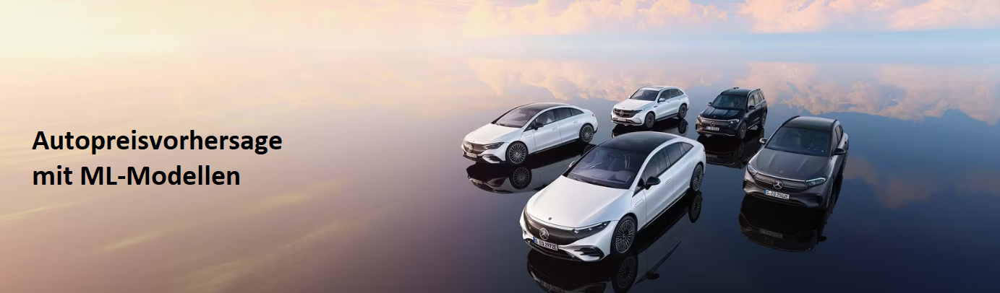

[Bild Quelle](https://www.mercedes-benz.com/content/dam/brandhub/vehicles/vehicle-overview/00-mercedes-benz-vehicles-passnger-cars-vans-2560x1440.cbv20230517105847.jpg/_jcr_content/renditions/mq7-original-aspect.jpeg)

<style>
.my-anchor2 {
  background-color: #af897c;
  font-family: newtimeroman;
  color: black;
  font-size: 100%;
  text-align: center;
  border-radius: 10px;
}
</style>
## <a class="my-anchor2" id="content">  Content  </a>


* [Ziel](#goal)
* [Datensatz Info](#info)
***
* [Vorbereitung der Daten für ML](#vdml)
    * [Import Bibliotheken](#imp_bib)
    * [Überblick über den Datensatz](#ub)
    * [Statistic der Daten](#st)
***
* [Analyse der Ausreiserdaten](#ausr)
  * [Behandlung von Ausreißerdaten in der Preisspalte](#price)
  * [Behandlung von Ausreißerdaten in der Kilometerspalte](#km)
  * [Behandlung von Ausreißerdaten in der KWspalte](#kw)
***
***
* [ML MODELS](#models)
  * [Linear Regression (Ridge, Lasso, Elesticnet)](#linear)
    * [Grid Search für Elesticnet](#gridlin)
    * [Feature Importance](#fimp)
  * [Random Forest Regressor](#rf)
    * [Grid Search für RF Regressor](#gridrf)
  * [Boosting Regressors(Adaboost, Gratientboosting, XGboost)](#boosting)
    * [Grid Search für XGboosting](#xg)
  * [LightGBM Regressor](#lightgbm)
    * [Grid Search for LightGBM Regressor](#gridlin)
    * [Feature Importance in LightGBM Regressor](#feaimp)
***
* [Auswertung](#auswertung)

***
* [Autopreisvorhersage mit Neuronales Netzwerk](#DeepL)

***
***
***

## <a class="my-anchor2" id="goal">  Ziel  </a>

* <font color="lightgreen" size="4"> Ziel dieses Projekts ist es, mit Hilfe von ML-Modellen Preisvorhersagen für die meistverkauften Fahrzeugmodelle auf der AutoScout-Website zu treffen.
- Der mit der Web-Scraping-Methode erstellte Datensatz hat den EDA-Prozess durchlaufen. In diesem Notebook werden die Daten für ML-Modelle aufbereitet und es wird versucht, mit verschiedenen Modellen die besten Ergebnisse zu erzielen.</font>

## <a class="my-anchor2" id="info">  Datensatzinfo  </a>

* <font color="lightgreen" size="4"> Die Daten wurden mit Web Scraping erstellt und in der zweiten Stufe bereinigt und neue Spalten angelegt. Die endgültige Version der Daten sieht wie folgt aus. </font>


| Spaltenname        | Beschreibung                                     |
|--------------------|--------------------------------------------------|
| Brand              | Die Marke des Autos                              |
| Model              | Das Modell des Autos                             |
| title              | Der Titel des Autos                              |
| Price              | Der Preis des Autos                              |
| Label              | Das Etikett des Autos                            |
| km                 | Die Kilometerangabe des Autos                    |
| gearbox            | Der Getriebetyp des Autos                        |
| Registration       | Das Anmeldungsdatum des Autos                    |
| fuel               | Die Kraftstoffart des Autos                      |
| kw                 | Die Leistung des Autos in Kilowatt               |
| ps                 | Die Leistung des Autos in PS                     |
| reg_month          | Der Monat der Anmeldung des Autos                |
| reg_year           | Das Jahr der Anmeldung des Autos                 |


* [Home](#content)


# <a class="my-anchor2" id="vdml">  Vorbereitung der Daten für ML  </a>

## <a class="my-anchor2" id="imp_bib">  Import Bibliotheken  </a>

* [Home](#content)

In [1]:
import warnings as wr
wr.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

## <a class="my-anchor2" id="ub">  Überblick über den Datensatz  </a>

In [124]:
df = pd.read_csv("cars_EDA.csv")
df_copy = df

In [125]:
df.head()

,Brand,Model,title,Price,Label,km,gearbox,registiration,fuel,kw,ps,reg_month,reg_year
0,Mercedes-Benz,a 180,Mercedes-Benz A 180 Progressive LED/Sportsitze...,25900,Guter Preis,14999,Schaltgetriebe,05/2020,Benzin,100.0,136.0,5,2020
1,Mercedes-Benz,a 180,Mercedes-Benz A 180 7G-DCT Style NAV+LED+SHZ+DAB+,24749,Sehr guter Preis,46750,Automatik,11/2019,Benzin,100.0,136.0,11,2019
2,Mercedes-Benz,a 180,"Mercedes-Benz A 180 ""Advanced"" AMG+PREMIUM+KAM...",32995,Keine Angabe,6560,Automatik,11/2022,Benzin,100.0,136.0,11,2022
3,Mercedes-Benz,a 180,"Mercedes-Benz A 180 AMG Line Limo., MBUX High ...",31500,Fairer Preis,16749,Automatik,01/2021,Benzin,100.0,136.0,1,2021
4,Mercedes-Benz,a 180,Mercedes-Benz A 180 AMG+NIGHT+KAMERA+LED+MBUX-...,33475,Keine Angabe,6900,Automatik,11/2022,Benzin,100.0,136.0,11,2022


In [126]:
# Wir haben die Registrierungsspalte bereits in Monat und Jahr unterteilt, so dass wir diese Spalte für das Modell nicht mehr benötigen.
df.drop("registiration", axis=1, inplace=True)

In [108]:
# Überprüfen wir, wie viele Fahrzeuge welchen Typs wir in unseren Daten haben.
model_counts = df.groupby(["Brand", "Model"]).size().reset_index(name="Model_Count")

# Drucken Sie die Anzahl der Modelle für jede Marke in einer separaten Tabelle
for brand in model_counts["Brand"].unique():
    brand_models = model_counts[model_counts["Brand"] == brand].sort_values(by="Model_Count", ascending=False)
    print(f"Marka: {brand}")
    print(brand_models[["Model", "Model_Count"]].reset_index(drop=True))
    print(30*"-")

Marka: Audi
         Model  Model_Count
0           a3         3330
1           a4         3311
2           a6         3047
3           q3         2702
4           a1         2377
5           a5         2344
6           q5         2234
7           q7         1212
8           a7          620
9           a8          578
10  a6 allroad          545
11  a4 allroad          516
------------------------------
Marka: BMW
   Model  Model_Count
0    320         2123
1    530         1902
2     x1         1880
3     x3         1747
4    520         1700
5    118         1578
6    330         1359
7     x5         1309
8     x2         1250
9    318          977
10   420          905
11   218          676
12   116          534
------------------------------
Marka: Ford
      Model  Model_Count
0     focus         3642
1      kuga         3464
2    fiesta         2933
3  ecosport         1927
4    mondeo         1397
------------------------------
Marka: Mercedes-Benz
     Model  Model_Count
0    

***
***

## <a class="my-anchor2" id="st"> Statistic der Daten </a> 

* [Home](#content)

In [109]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,123279.0,30548.506818,14146.885003,2799.0,20930.0,27650.0,36970.0,369950.0
km,123279.0,45616.542777,45962.408101,0.0,11000.0,31000.0,68000.0,646000.0
fuel,123279.0,1.535728,0.632463,1.0,1.0,1.0,2.0,5.0
kw,123279.0,122.926774,42.657384,1.0,96.0,110.0,140.0,532.0
ps,123279.0,167.244779,57.951712,1.0,131.0,150.0,190.0,723.0
reg_month,123279.0,5.825477,3.727082,0.0,3.0,6.0,9.0,12.0
reg_year,123279.0,1894.208527,487.802923,0.0,2018.0,2020.0,2021.0,2023.0


* <font color="lightgreen" size="4">Wenn wir uns die Tabelle ansehen, können wir feststellen,<br> dass es in den Spalten Preis, km und kw Ausreißer geben kann und wir diese Spalten überprüfen müssen.</font>

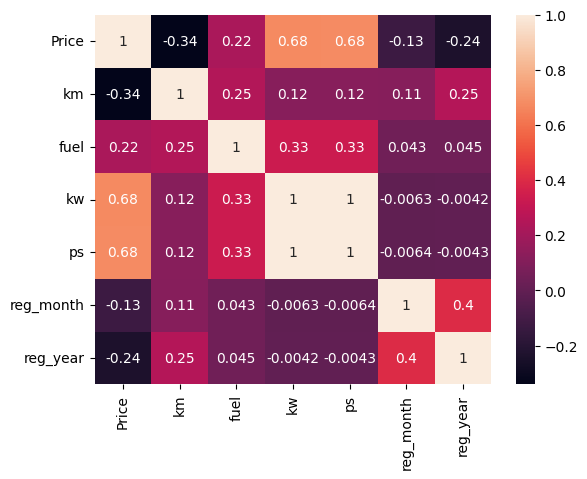

In [7]:
sns.heatmap(df.select_dtypes(include=np.number).corr(), annot=True);

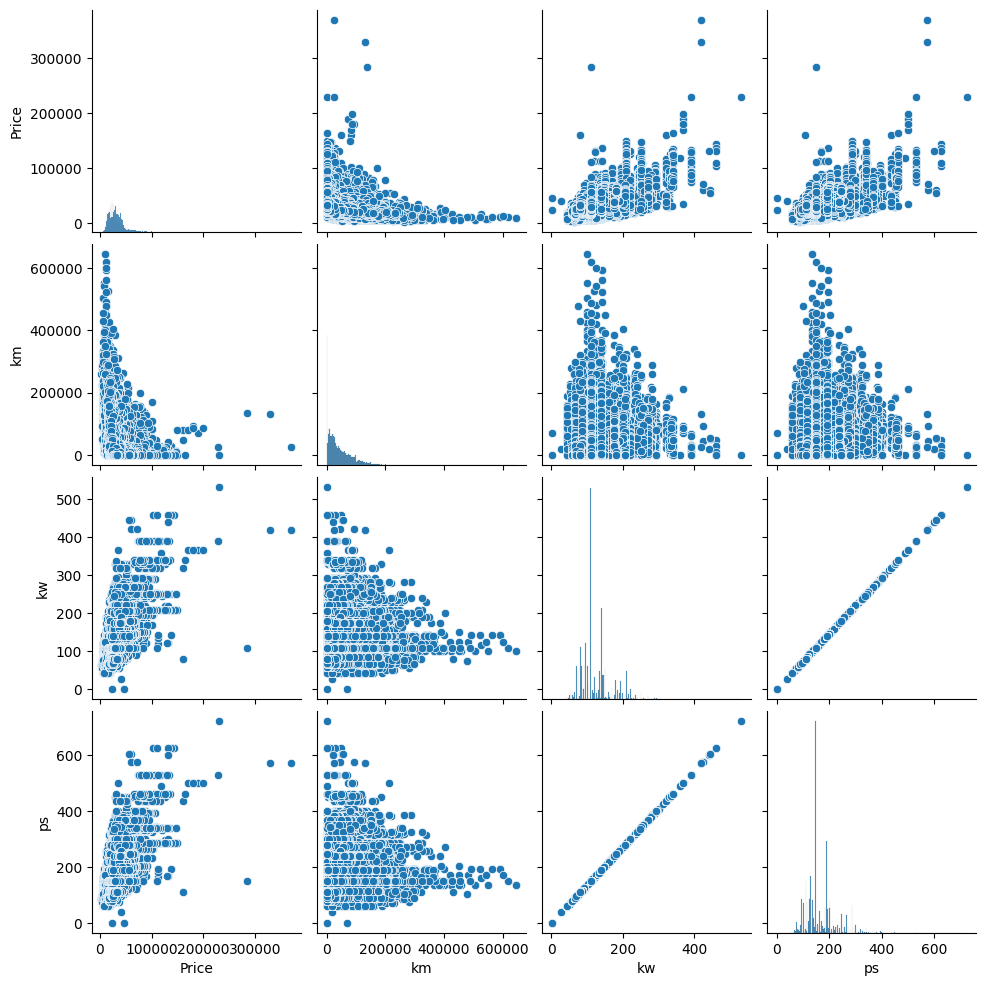

In [8]:
sns.pairplot(df[["Price", "km", "kw", "ps"]]);

In [127]:
# Da die Korrelation zwischen den Spalten ps und kw gleich 1 ist, können wir eine der beiden Spalten entfernen.
df.drop("ps", axis=1, inplace=True)

## <a class="my-anchor2" id="ausr"> Analyse von Ausreißerdaten </a>

* [Home](#content)

* <font color="lightgreen" size="4"> Wenn wir uns die Statistik der Daten ansehen, stellen wir fest, dass es in den Spalten Preis und km möglicherweise Ausreißer gibt. lassen Sie uns das überprüfen.</font>



### <a class="my-anchor2" id="price"> Behandlung von Ausreißerdaten in der Preisspalte </a>

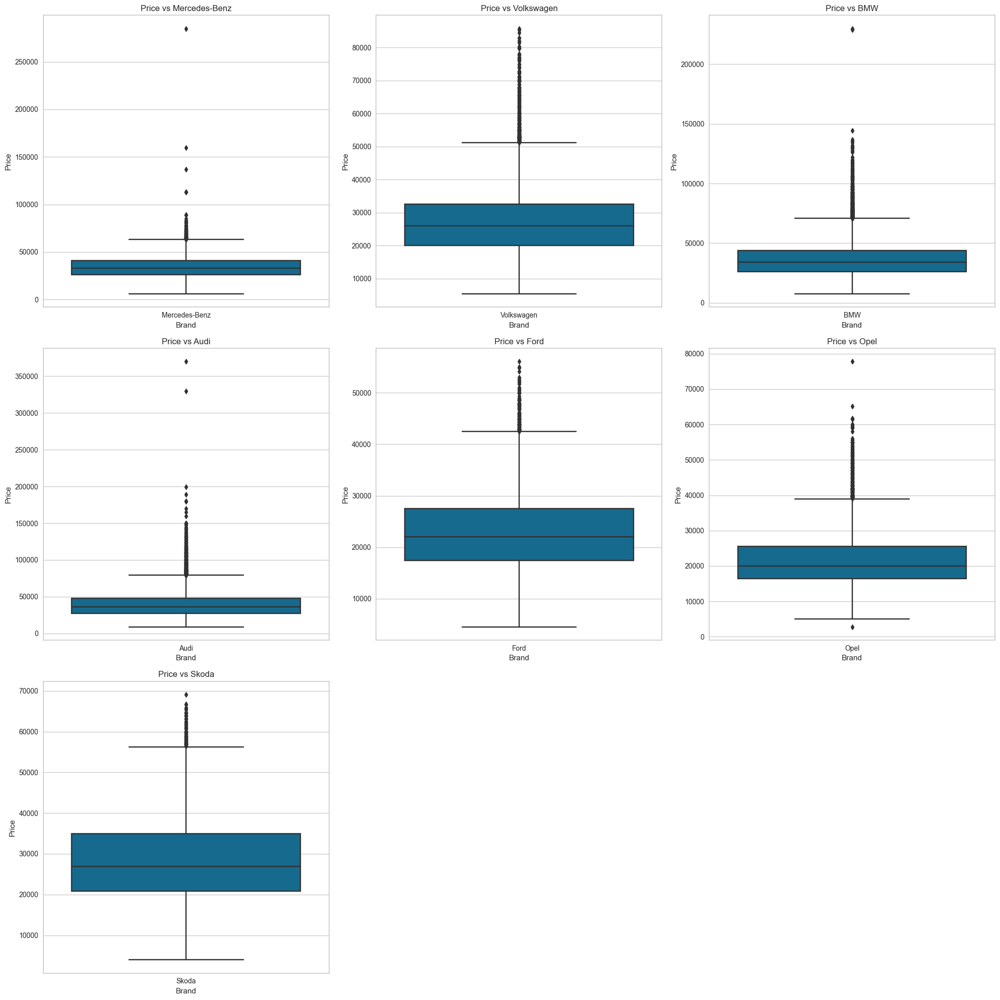

In [111]:
plt.figure(figsize=(20, 20))
index = 0

for feature in df["Brand"].unique():
    index += 1
    plt.subplot(3, 3, index)
    sns.boxplot(x='Brand', y='Price', data=df[df["Brand"] == feature])
    plt.title(f"Price vs {feature}")
    
plt.tight_layout()
plt.show()

* <font color="lightgreen" size="4"> Wenn wir die Ausreißerdaten nach Preis analysieren, stellen wir fest, dass etwa 2 % der Daten Ausreißerdaten sind. Es ist jedoch notwendig, dies auf Marken- und Modellbasis zu betrachten, anstatt diesen allgemeinen Überblick zu geben. Einige Zahlen in der allgemeinen Preisspanne sind möglicherweise nicht für jedes Modell Ausreißerdaten. Daher werden wir die Modelle für sich selbst bewerten. </font>

In [11]:
outlier_data = []

for brand in df["Brand"].unique():
    brand_price_data = df[df["Brand"] == brand]
    q1 = brand_price_data["Price"].quantile(0.25)
    q3 = brand_price_data["Price"].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    total_count = len(brand_price_data)
    
    if total_count > 0:
        outlier_count = len(brand_price_data[(brand_price_data["Price"] < lower_bound) | (brand_price_data["Price"] > upper_bound)])
        outlier_rate = outlier_count / total_count
    else:
        outlier_rate = 0
    
    outlier_data.append({"Brand": brand, "Outlier_Rate": outlier_rate})

outlier_rates = pd.DataFrame(outlier_data)

print(outlier_rates)

           Brand  Outlier_Rate
0  Mercedes-Benz      0.011148
1     Volkswagen      0.022846
2            BMW      0.049164
3           Audi      0.028270
4           Ford      0.017287
5           Opel      0.025985
6          Skoda      0.007273


* <font color="lightgreen" size="4"> Um Ausreißerdaten effizienter bewerten zu können, sollten Marken und Modelle einer eigenen Bewertung unterzogen werden.</font>

In [112]:
# Sehen wir uns alle Marken in ihrer Modellpreisklasse an
from re import template


for br in df.Brand.unique():
    marke = df[df["Brand"] == br]
    fig = px.box(marke, x="Model", y="Price", title=f"Price vs Model for {br}",
                category_orders={"Model": marke["Model"].unique()})
    fig.update_layout(showlegend=False, template="plotly_dark")
    fig.show()

Wichtig: <font color="lightgreen" size="4"> Auf der Autoscout-Website wurden die höchsten und niedrigsten Preise für die Modelle getrennt ermittelt. Dementsprechend werden hier zwar einige Werte als Ausreißer angesehen, es wurde aber beobachtet, dass die Zahlen tatsächlich von den iqr-Grenzwerten abweichen können. Lassen Sie uns daher die Preisgrenzen für die Modelle nach den Angaben auf der Website auswerten und die Ausreißerdaten entsprechend aus dem Datensatz löschen.</font>

### Mercedes-Benz

In [128]:
# Ermitteln wir die entsprechenden Preisspannen für Mercedes-Modelle
price_ranges = {
    "c 180": (0, 80000),
    "c 200": (0, 80000),
    "cla 200": (0, 60000),
    "e 220": (10000, 85000)
}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in price_ranges.items():
    mask = (df["Brand"] == "Mercedes-Benz") & (df["Model"] == model) & ((df["Price"] < lower_bound) | (df["Price"] > upper_bound))
    df = df[~mask]



### Audi

In [129]:
# Ermitteln wir die entsprechenden Preisspannen für Audi
price_ranges = {
    "a4": (0, 85000),
    "a6": (0, 97000),
    "a6 allroad": (0, 90000),
    "a7": (0, 76000),
    "a8": (0, 150000),
    "q3": (13000,70000)
}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in price_ranges.items():
    mask = (df["Brand"] == "Audi") & (df["Model"] == model) & ((df["Price"] < lower_bound) | (df["Price"] > upper_bound))
    df = df[~mask]

### Volkswagen

In [130]:
# Ermitteln wir die entsprechenden Preisspannen für Audi
price_ranges = {
    "golf": (0, 60000),
    "golf gti": (0, 58000),
    "golf variant": (0, 60000),
    "passat": (0, 42000),
    "passat variant": (0, 67000),
    "t-roc": (0,60000),
    "polo": (0,40000),
}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in price_ranges.items():
    mask = (df["Brand"] == "Volkswagen") & (df["Model"] == model) & ((df["Price"] < lower_bound) | (df["Price"] > upper_bound))
    df = df[~mask]

### BMW

In [131]:
# Ermitteln wir die entsprechenden Preisspannen für Audi
price_ranges = {
    "116" : (0, 40000),
    "x2": (0, 65000),
    "x3": (0, 90000),
    "x5": (0, 140000)
}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in price_ranges.items():
    mask = (df["Brand"] == "BMW") & (df["Model"] == model) & ((df["Price"] < lower_bound) | (df["Price"] > upper_bound))
    df = df[~mask]

### Ford

In [132]:
# Ermitteln wir die entsprechenden Preisspannen für Audi
price_ranges = {
    "edge" : (0, 48000),
    "focus": (5000, 50000),
    "kuga": (0, 53000)
}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in price_ranges.items():
    mask = (df["Brand"] == "Ford") & (df["Model"] == model) & ((df["Price"] < lower_bound) | (df["Price"] > upper_bound))
    df = df[~mask]

### Opel

In [133]:
# Ermitteln wir die entsprechenden Preisspannen für Audi
price_ranges = {
    "corsa" : (5000, 30000),
    "insignia" : (6400, 50000),
    "mokka" : (10000, 40000),
    "adam" : (0, 20000),
    "grandland" : (0, 55000),
    "grandland x" : (10000, 50000),
    "crossland": (12000, 35000),
    "crossland x": (0, 33000)
}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in price_ranges.items():
    mask = (df["Brand"] == "Opel") & (df["Model"] == model) & ((df["Price"] < lower_bound) | (df["Price"] > upper_bound))
    df = df[~mask]

### Skoda

In [134]:
# Ermitteln wir die entsprechenden Preisspannen für Audi
price_ranges = {
    "superb" : (0, 65000),
    "kodiaq" : (0, 53000),
    "karoq" : (0, 53000)}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in price_ranges.items():
    mask = (df["Brand"] == "Skoda") & (df["Model"] == model) & ((df["Price"] < lower_bound) | (df["Price"] > upper_bound))
    df = df[~mask]

### <a class="my-anchor2" id="km"> Behandlung von Ausreißerdaten in der Kilometerspalte </a>

[Home](#content)

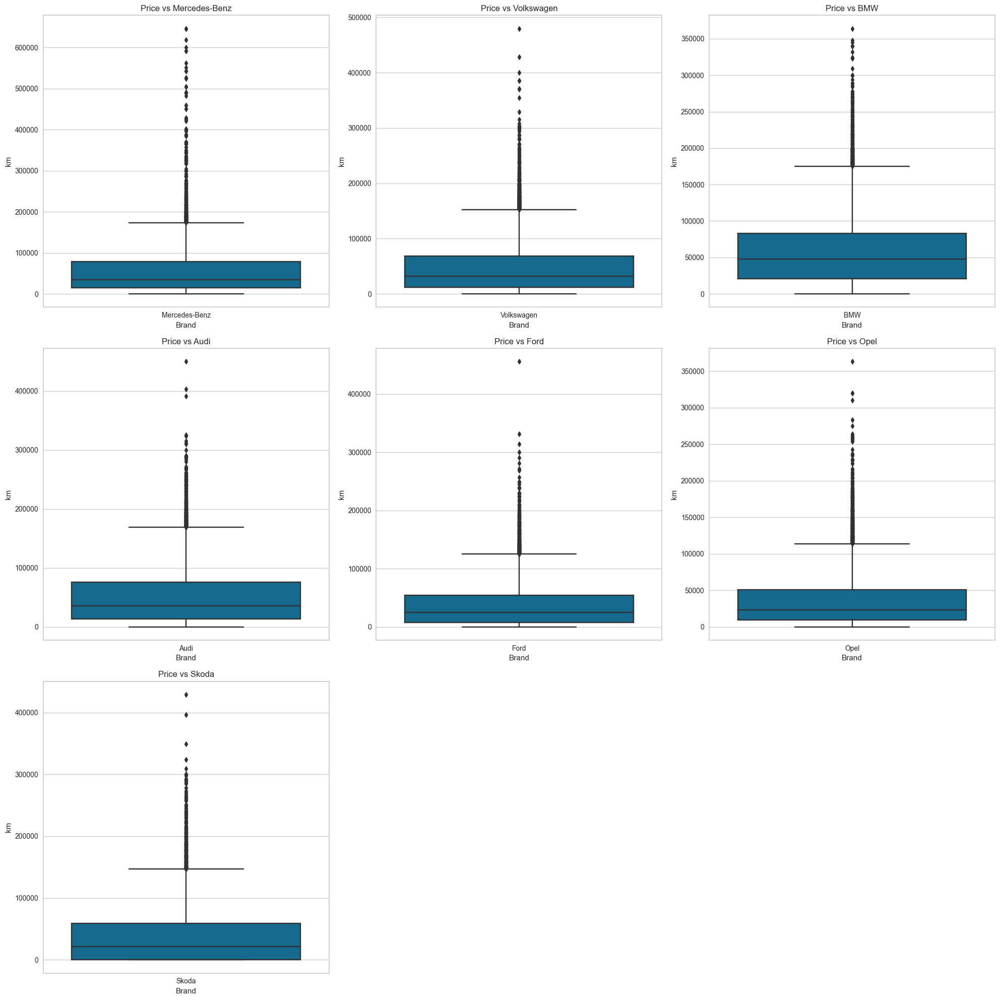

In [113]:
plt.figure(figsize=(20, 20))
index = 0

for feature in df["Brand"].unique():
    index += 1
    plt.subplot(3, 3, index)
    sns.boxplot(x='Brand', y='km', data=df[df["Brand"] == feature])
    plt.title(f"Price vs {feature}")
    
plt.tight_layout()
plt.show()

In [114]:
# Sehen wir uns alle Marken in ihrer Modellpreisklasse an
for br in df.Brand.unique():
    marke = df[df["Brand"] == br]
    fig = px.box(marke, x="Model", y="km", title=f"km vs Model for {br}",
                category_orders={"Model": marke["Model"].unique()})
    fig.update_layout(showlegend=False, template="plotly_dark")
    fig.show()

In [135]:
# Belirli km aralıkları için ortalama fiyatları hesaplamak için DataFrame oluştur
km_ranges = [0, 50000, 100000, 150000, 200000, 250000, 300000, float("inf")]
km_labels = ["0-50k", "50k-100k", "100k-150k", "150k-200k", "200k-250k", "250k-300k", ">300k"]

df["km_range"] = pd.cut(df["km"], bins=km_ranges, labels=km_labels)

# Belirli km aralıkları için ortalama fiyatları hesapla
df.groupby("km_range")["Price"].mean().round(0).reset_index()

,km_range,Price
0,0-50k,32748.0
1,50k-100k,26476.0
2,100k-150k,22944.0
3,150k-200k,19712.0
4,200k-250k,17089.0
5,250k-300k,15089.0
6,>300k,13256.0


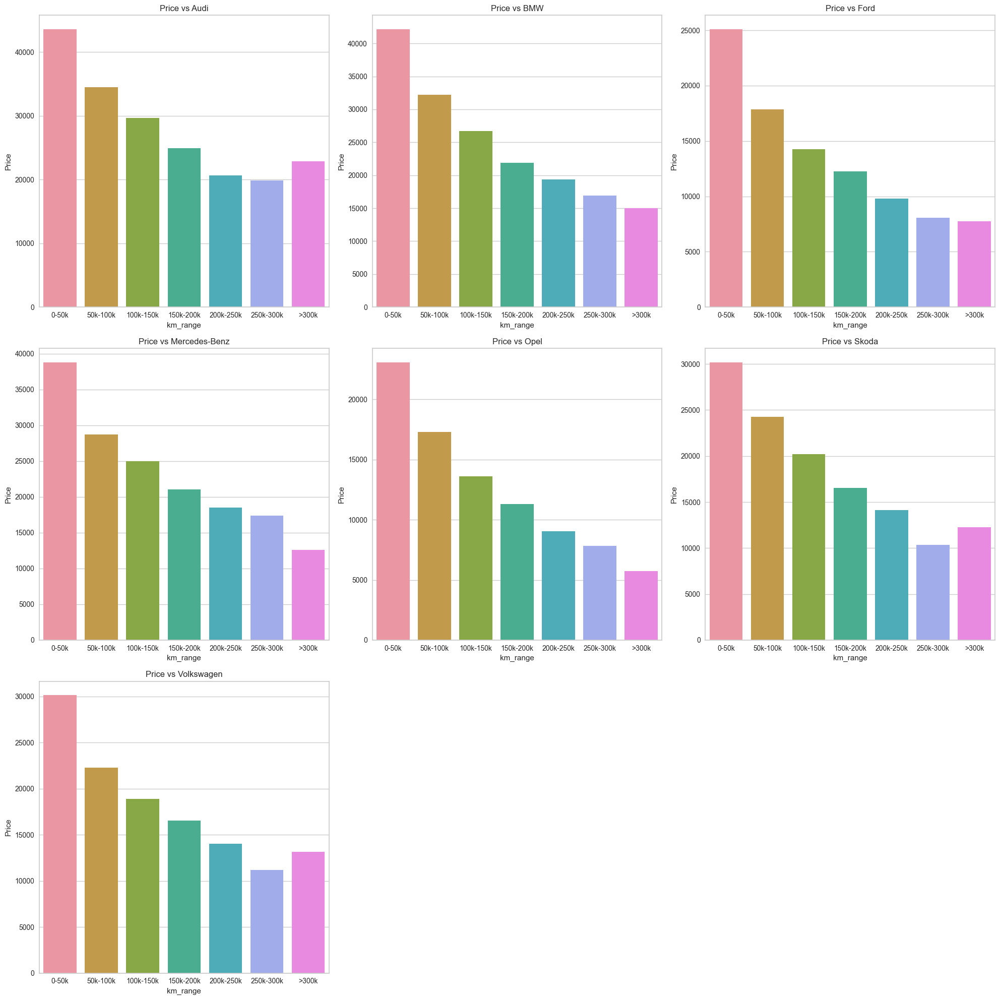

In [116]:
plt.figure(figsize=(20, 20))
index = 0

km_check = df.groupby(["Brand", "km_range"])["Price"].mean().round(0).reset_index()

for feature in km_check["Brand"].unique():
    index += 1
    plt.subplot(3, 3, index)
    sns.barplot(x='km_range', y='Price', data=km_check[km_check["Brand"] == feature])
    plt.title(f"Price vs {feature}")
    
plt.tight_layout()
plt.show()

In [136]:
df[df.km > 250000].Model.value_counts().sum()

302

<font color="lightgreen" size="4"> Betrachtet man die Grafiken und die durch die Kategorisierung nach km erhaltenen Preisdurchschnitte, so kann man davon ausgehen, dass Fahrzeuge mit mehr als 250 Tausend km Ausreißer im Datensatz sind. Daher schließen wir diese Daten aus unseren Daten aus. </font>

In [137]:
df = df[df.km < 250000]

In [138]:
df.drop("km_range", axis=1, inplace=True)

### <a class="my-anchor2" id="kw"> Behandlung von Ausreißerdaten in der KW </a>

[Home](#content)

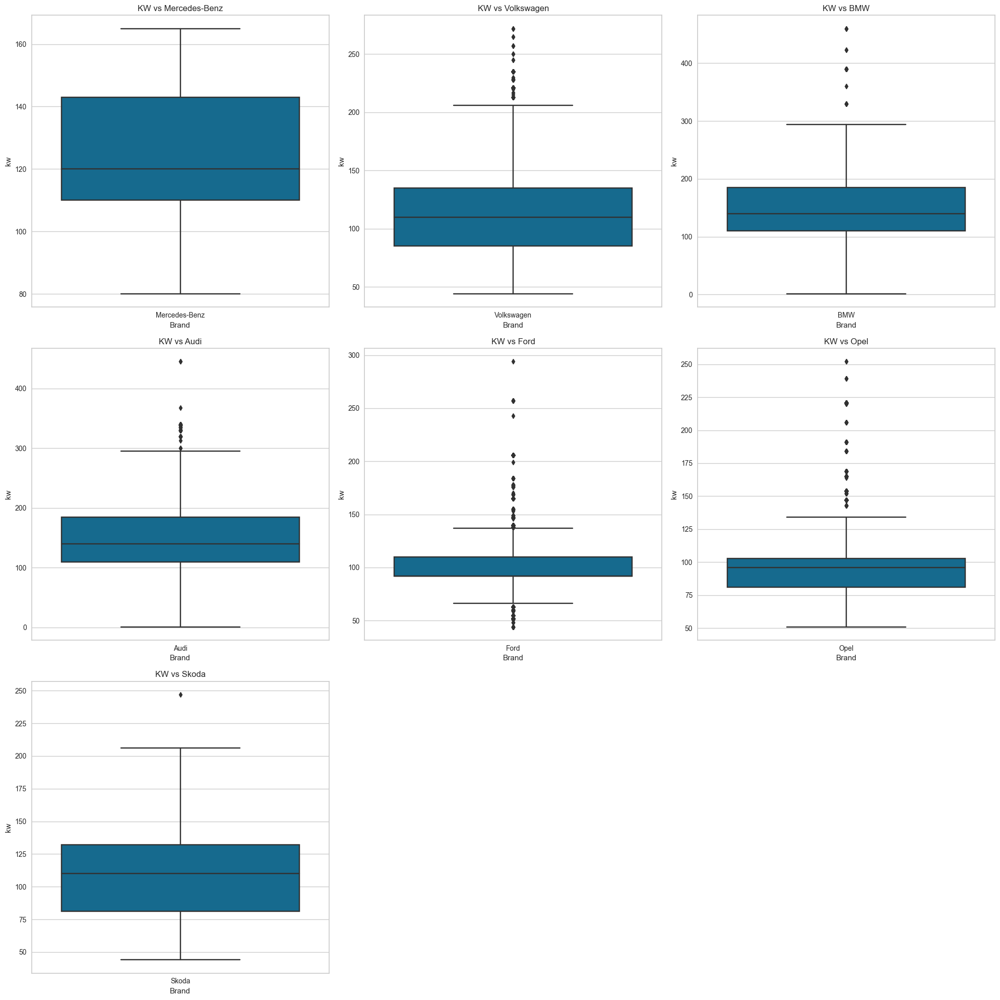

In [178]:
plt.figure(figsize=(20, 20))
index = 0

for feature in df["Brand"].unique():
    index += 1
    plt.subplot(3, 3, index)
    sns.boxplot(x='Brand', y='kw', data=df[df["Brand"] == feature])
    plt.title(f"KW vs {feature}")
    
plt.tight_layout()
plt.show()

In [179]:
# Sehen wir uns alle Marken in ihrer Modellpreisklasse an
for br in df.Brand.unique():
    marke = df[df["Brand"] == br]
    fig = px.box(marke, x="Model", y="kw", title=f"kw vs Model for {br}",
                category_orders={"Model": marke["Model"].unique()})
    fig.update_layout(showlegend=False, template="plotly_dark")
    fig.show()

## Mercedes-Benz

In [180]:
# Ermitteln wir die entsprechenden Preisspannen für Audi
kw_ranges = {
    "a 200" : (110, 150),
    "c 220" : (125, 165),
    "e 220" : (125, 165)}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in kw_ranges.items():
    mask = (df["Brand"] == "Mercedes-Benz") & (df["Model"] == model) & ((df["kw"] < lower_bound) | (df["kw"] > upper_bound))
    df = df[~mask]

## Volkswagen

In [181]:
# Ermitteln wir die entsprechenden Preisspannen für Audi
kw_ranges = {
    "golf": (0, 200),
    "golf variant": (0, 150),
    "passat": (0, 200),
    "passat variant": (0, 200),
    "tiguan": (0, 200),
    "t-roc": (100, 200),
    "polo": (55, 100)}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in kw_ranges.items():
    mask = (df["Brand"] == "Volkswagen") & (df["Model"] == model) & ((df["kw"] < lower_bound) | (df["kw"] > upper_bound))
    df = df[~mask]

## BMW

In [182]:
kw_ranges = {
    116 : (0, 100),
    218 : (0, 200),
    320 : (110, 200),
    "x1" : (85, 200),
    "x2" : (0, 200),
    "x5" : (0, 350)}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in kw_ranges.items():
    mask = (df["Brand"] == "BMW") & (df["Model"] == model) & ((df["kw"] < lower_bound) | (df["kw"] > upper_bound))
    df = df[~mask]

## Audi

In [183]:
kw_ranges = {
    "a1" : (60, 200),
    "a3" : (0, 165),
    "a4" : (0, 215),
    "a5" : (0, 215),
    "a8" : (0, 340),
    "q7" : (0, 300),
    "q3" : (0, 200)}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in kw_ranges.items():
    mask = (df["Brand"] == "Audi") & (df["Model"] == model) & ((df["kw"] < lower_bound) | (df["kw"] > upper_bound))
    df = df[~mask]

## Ford

In [184]:
kw_ranges = {
    "focus" : (0, 150),
    "fiesta" : (0, 135)
}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in kw_ranges.items():
    mask = (df["Brand"] == "Ford") & (df["Model"] == model) & ((df["kw"] < lower_bound) | (df["kw"] > upper_bound))
    df = df[~mask]

## Opel

In [185]:
kw_ranges = {
    "astra" : (0, 150),
    "corsa" : (0, 110),
    "insignia" : (80, 155),
    "grandland" : (0, 200),
    "grandland x" : (0, 200)}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in kw_ranges.items():
    mask = (df["Brand"] == "Opel") & (df["Model"] == model) & ((df["kw"] < lower_bound) | (df["kw"] > upper_bound))
    df = df[~mask]

## Skoda

In [186]:
kw_ranges = {
    "octavia" : (70, 170),
    "fabia" : (0, 110),
    "superb" : (0, 200),
    "kodiaq" : (0, 200)}

# Daten löschen, die nicht in die entsprechende Preisspanne passen
for model, (lower_bound, upper_bound) in kw_ranges.items():
    mask = (df["Brand"] == "Skoda") & (df["Model"] == model) & ((df["kw"] < lower_bound) | (df["kw"] > upper_bound))
    df = df[~mask]

## <a class="my-anchor2" id="letzte"> Ein letzter Überblick über die Daten vor der Modellierung </a>

[Home](#content)

In [139]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 122663 entries, 0 to 123278
Data columns (total 11 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Brand      122663 non-null  object 
 1   Model      122663 non-null  object 
 2   title      122663 non-null  object 
 3   Price      122663 non-null  int64  
 4   Label      122663 non-null  object 
 5   km         122663 non-null  int64  
 6   gearbox    122663 non-null  object 
 7   fuel       122663 non-null  object 
 8   kw         122663 non-null  float64
 9   reg_month  122663 non-null  int64  
 10  reg_year   122663 non-null  int64  
dtypes: float64(1), int64(4), object(6)
memory usage: 11.2+ MB


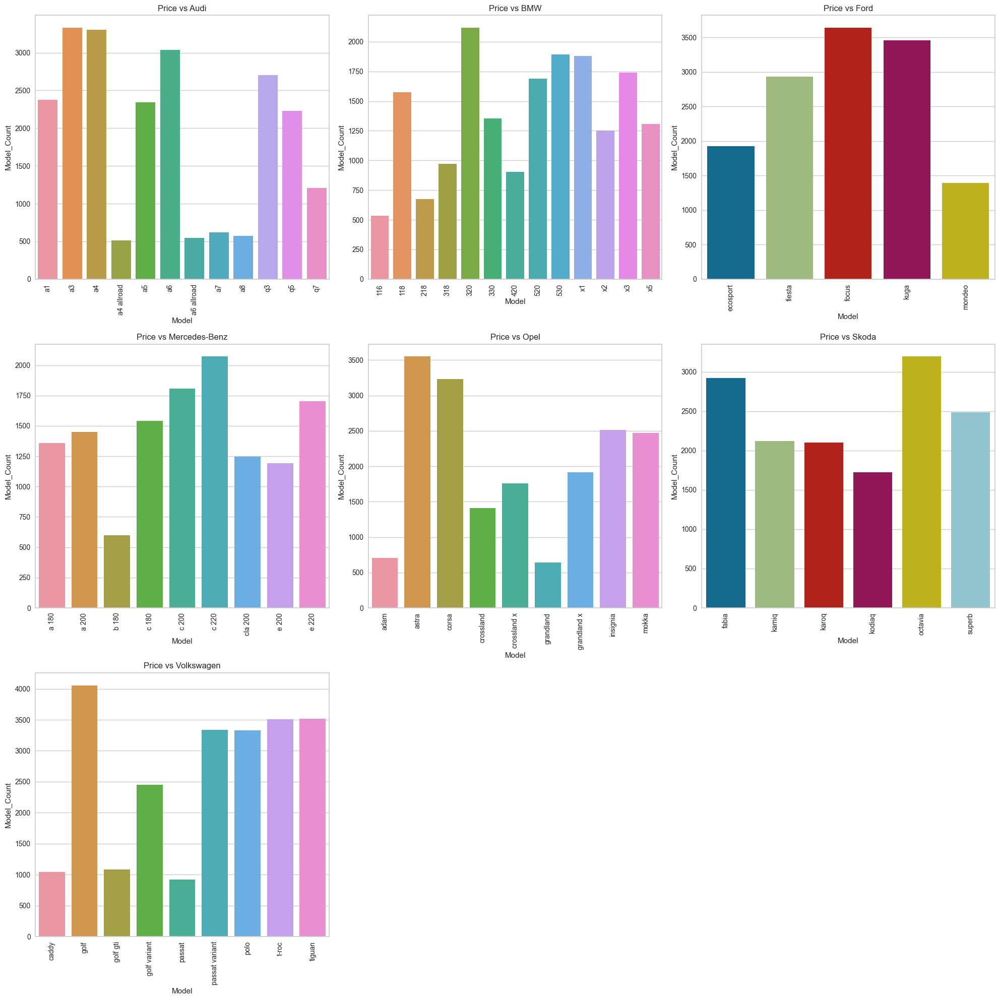

In [121]:
model_counts = df.groupby(["Brand", "Model"]).size().reset_index(name="Model_Count")

plt.figure(figsize=(20, 20))
index = 0


for feature in model_counts["Brand"].unique():
    index += 1
    plt.subplot(3, 3, index)
    sns.barplot(x='Model', y="Model_Count", data=model_counts[model_counts["Brand"] == feature])
    plt.title(f"Price vs {feature}")
    plt.xticks(rotation=90)
    
plt.tight_layout()
plt.show()

In [195]:
df.to_csv("cars_for_ml.csv", index=False)

***
***

## <a class="my-anchor2" id="models"> ML Models </a>

* [Home](#content)

In [198]:
df.fuel.value_counts()

fuel
Benzin     62412
Diesel     49207
Hybrid      7049
Gas          256
Elektro      155
Name: count, dtype: int64

In [200]:
# Encoding
df_lin = pd.get_dummies(df, columns = ['Brand', 'Model', 'gearbox', "fuel"])
df_lin = df_lin.replace({True: 1, False: 0}).drop(["title", "Label"], axis=1)
df_lin

,Price,km,kw,reg_month,reg_year,Brand_Audi,Brand_BMW,Brand_Ford,Brand_Mercedes-Benz,Brand_Opel,...,Model_x3,Model_x5,gearbox_Automatik,gearbox_Halbautomatik,gearbox_Schaltgetriebe,fuel_Benzin,fuel_Diesel,fuel_Elektro,fuel_Gas,fuel_Hybrid
0,25900,14999,100.0,5,2020,0,0,0,1,0,...,0,0,0,0,1,1,0,0,0,0
1,24749,46750,100.0,11,2019,0,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
2,32995,6560,100.0,11,2022,0,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
3,31500,16749,100.0,1,2021,0,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
4,33475,6900,100.0,11,2022,0,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123274,35490,20,81.0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
123275,32990,10,110.0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
123276,29990,10,110.0,10,2022,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
123277,31680,0,81.0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0


In [201]:
df_lin.info()

<class 'pandas.core.frame.DataFrame'>
Index: 119079 entries, 0 to 123278
Data columns (total 83 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Price                   119079 non-null  int64  
 1   km                      119079 non-null  int64  
 2   kw                      119079 non-null  float64
 3   reg_month               119079 non-null  int64  
 4   reg_year                119079 non-null  int64  
 5   Brand_Audi              119079 non-null  int64  
 6   Brand_BMW               119079 non-null  int64  
 7   Brand_Ford              119079 non-null  int64  
 8   Brand_Mercedes-Benz     119079 non-null  int64  
 9   Brand_Opel              119079 non-null  int64  
 10  Brand_Skoda             119079 non-null  int64  
 11  Brand_Volkswagen        119079 non-null  int64  
 12  Model_116               119079 non-null  int64  
 13  Model_118               119079 non-null  int64  
 14  Model_218               1

In [188]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression 

X = df_lin.drop("Price", axis=1)
y = df_lin.Price

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train) 
X_test_scaled = scaler.transform(X_test)

## <a class="my-anchor2" id="linear"> Linear Regression (Ridge, Lasso, Elesticnet) </a>

* [Home](#content)

In [190]:
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.linear_model import ElasticNet, ElasticNetCV 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def train_val(y_train, y_train_pred, y_test, y_pred, i):
    scores = {
        i+"_train": {
            "R2": f'{r2_score(y_train, y_train_pred):.4f}',
            "mae": f'{mean_absolute_error(y_train, y_train_pred):.4f}',
            "mse": f'{mean_squared_error(y_train, y_train_pred):.4f}',
            "rmse": f'{np.sqrt(mean_squared_error(y_train, y_train_pred)):.4f}'
        },
        i+"_test": {
            "R2": f'{r2_score(y_test, y_pred):.4f}',
            "mae": f'{mean_absolute_error(y_test, y_pred):.4f}',
            "mse": f'{mean_squared_error(y_test, y_pred):.4f}',
            "rmse": f'{np.sqrt(mean_squared_error(y_test, y_pred)):.4f}'
        }
    }
    return pd.DataFrame(scores)


In [202]:
linear_model = LinearRegression()  
ridge_model = Ridge(alpha=0.01, random_state=101)
lasso_model = Lasso(alpha=0.01, random_state=101)
elastic_model = ElasticNet(alpha=0.01, l1_ratio=1, random_state=101)

models = [("linear_model", linear_model), ("Ridge", ridge_model), ("Lasso", lasso_model), ("ElasticNet", elastic_model)]

scaler = MinMaxScaler()
X = df_lin.drop("Price", axis=1)
y = df_lin.Price

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

X_train_scaled = scaler.fit_transform(X_train) 
X_test_scaled = scaler.transform(X_test)

for model_name, m in models:
    m.fit(X_train_scaled, y_train)

    y_pred = m.predict(X_test_scaled)
    y_train_pred = m.predict(X_train_scaled)

    # result evaluation
    rs = train_val(y_train, y_train_pred, y_test, y_pred, model_name)
    print(rs)
    print(40*"-")

     linear_model_train linear_model_test
R2               0.8273            0.8279
mae           4006.0323         4047.5608
mse       33136439.0079     33444463.5162
rmse          5756.4259         5783.1188
----------------------------------------
        Ridge_train     Ridge_test
R2           0.8273         0.8279
mae       4005.4022      4046.7369
mse   33135483.2463  33439621.6350
rmse      5756.3429      5782.7002
----------------------------------------
        Lasso_train     Lasso_test
R2           0.8273         0.8279
mae       4005.3947      4046.7148
mse   33135484.9570  33439551.2760
rmse      5756.3430      5782.6941
----------------------------------------
     ElasticNet_train ElasticNet_test
R2             0.8273          0.8279
mae         4005.3947       4046.7148
mse     33135484.9570   33439551.2760
rmse        5756.3430       5782.6941
----------------------------------------


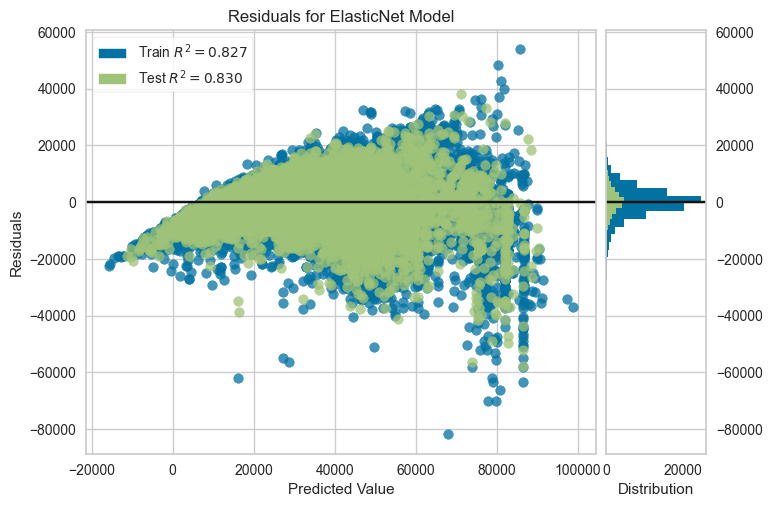

<Axes: title={'center': 'Residuals for ElasticNet Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [197]:
from yellowbrick.regressor import ResidualsPlot

# Instantiate the linear model and visualizer
visualizer = ResidualsPlot(elastic_model)

visualizer.fit(X_train_scaled, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test)  # Evaluate the model on the test data
visualizer.show()  

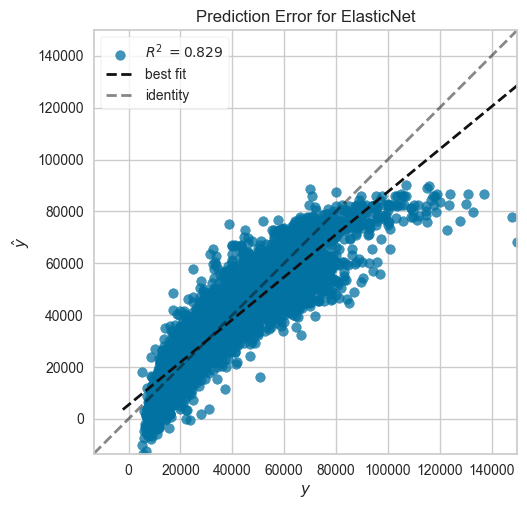

In [192]:
from yellowbrick.regressor import PredictionError
visualizer = PredictionError(elastic_model)

visualizer.fit(X_train_scaled, y_train)
visualizer.score(X_test_scaled, y_test)
visualizer.show();

## <a class="my-anchor2" id="gridlin"> Grid Search for Linear Regression </a>

* [Home](#content)

In [146]:
from sklearn.model_selection import GridSearchCV

elastic_model = ElasticNet(max_iter = 10000, random_state=42)

param_grid = {"alpha":[0.01,0.012,0.2,0.5,0.6,0.7,1],
             "l1_ratio":[0.1,0.5,0.7,0.9,0.95,0.99,1]}

grid_model = GridSearchCV(estimator = elastic_model, 
                          param_grid = param_grid, 
                          scoring = 'neg_root_mean_squared_error',
                          cv =5)

grid_model.fit(X_train_scaled, y_train)

print("beste Parameter: ", grid_model.best_params_)

beste Parameter:  {'alpha': 0.012, 'l1_ratio': 1}


In [193]:
elastic_model = ElasticNet(alpha=0.012, l1_ratio=1, random_state=101)
elastic_model.fit(X_train_scaled, y_train)

y_pred = elastic_model.predict(X_test_scaled)
y_train_pred = elastic_model.predict(X_train_scaled)

# result evaluation
train_val(y_train, y_train_pred, y_test, y_pred, "elastic_model")


,elastic_model_train,elastic_model_test
R2,0.8269,0.8292
mae,4010.6815,4035.8350
mse,33061509.5625,33735043.8306
rmse,5749.9139,5808.1877


### <a class="my-anchor2" id="fimp"> Feature Importance </a>

* [Home](#content)

In [150]:
feature_importances = pd.Series(elastic_model.coef_, index=X.columns)
sorted_feature_importances = feature_importances.abs().sort_values(ascending=False)

print(sorted_feature_importances)

kw                    46210.448775
km                    37777.032432
Model_a8              31152.370458
Model_x5              30893.850849
Model_q7              27329.903082
                          ...     
Model_c 220             470.149667
Model_118               450.847455
Model_octavia           156.768518
Model_golf variant       86.111513
Model_c 200               2.319589
Length: 78, dtype: float64


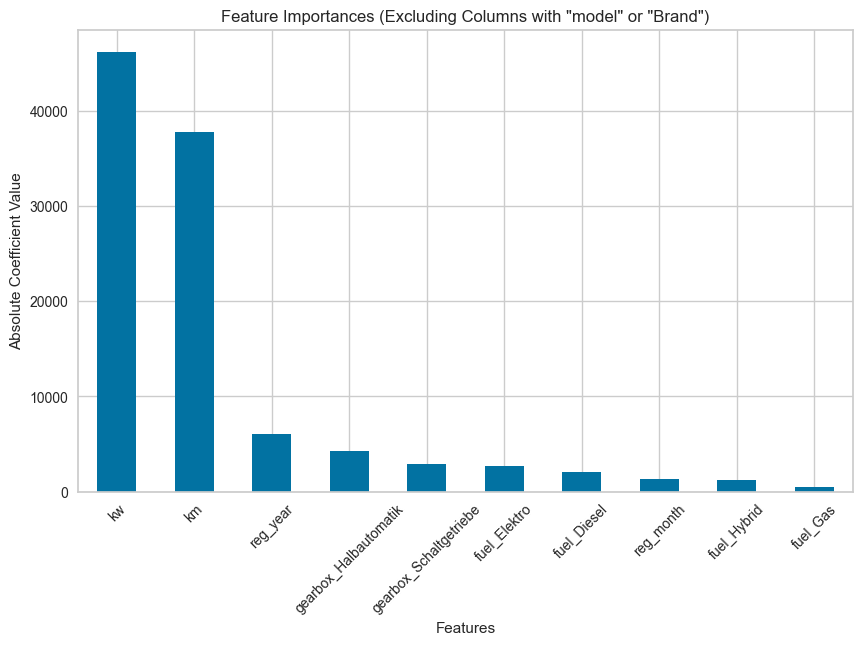

In [159]:
# Filter out columns containing the words "model" or "Brand"
filtered_feature_importances = sorted_feature_importances[~sorted_feature_importances.index.str.contains('model|Brand', case=False)]

# Plot the feature importances
plt.figure(figsize=(10, 6))
filtered_feature_importances.plot(kind='bar')
plt.title('Feature Importances (Excluding Columns with "model" or "Brand")')
plt.xlabel('Features')
plt.ylabel('Absolute Coefficient Value')
plt.xticks(rotation=45)
plt.show()


***

## <a class="my-anchor2" id="rf"> Random Forest </a>

* [Home](#content)

In [194]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(random_state=101) 

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)
y_train_pred = rf_model.predict(X_train)

train_val(y_train, y_train_pred, y_test, y_pred, "Rf Model")

,Rf Model_train,Rf Model_test
R2,0.9776,0.9269
mae,1095.3622,2398.1534
mse,4280590.1922,14438001.0860
rmse,2068.9587,3799.7370


## <a class="my-anchor2" id="gridrf"> Grid Search for RF Regressor </a>

* [Home](#content)

In [40]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

param_dist = {
    'n_estimators': [64, 128, 200, 500],
    'max_depth': [None, 4, 5, 6, 7, 8],
    'min_samples_leaf': [1, 2, 3, 4],
    'min_samples_split': [2, 3, 5, 6]
}

model = RandomForestRegressor(random_state=101)
random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10, cv=10, random_state=42)
random_search.fit(X_train, y_train)

random_search.best_params_

{'n_estimators': 128,
 'min_samples_split': 2,
 'min_samples_leaf': 3,
 'max_depth': None}

In [161]:
rf_final_model = RandomForestRegressor(n_estimators=128, min_samples_split=2,
                                 min_samples_leaf=3, max_depth= None, random_state=101) 

rf_final_model.fit(X_train, y_train)

y_pred = rf_final_model.predict(X_test)
y_train_pred = rf_final_model.predict(X_train)

train_val(y_train, y_train_pred, y_test, y_pred, "Rf Model")

,Rf Model_train,Rf Model_test
R2,0.9592,0.9250
mae,1702.9830,2445.8351
mse,7871665.5184,14489819.6565
rmse,2805.6489,3806.5496


***

## <a class="my-anchor2" id="boosting"> Boosting Regressors(Adaboost, Gratientboosting, XGboost) </a>

* [Home](#content)

In [163]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor


ada_model = AdaBoostRegressor(random_state=101, n_estimators=50)
grad_model = GradientBoostingRegressor(random_state=101)
xgb_model = XGBRegressor(random_state=101, objective="reg:squarederror")

models = [("ada_model", ada_model), ("grad_model", grad_model), ("xgb_model", xgb_model)]

for model_name, m in models:
    m.fit(X_train, y_train)

    # prediction yapıp modeli kontrol ediyoruz.
    y_pred = m.predict(X_test)
    y_train_pred = m.predict(X_train)

    # Sonucları kontrol ediyoruz.
    rs = train_val(y_train, y_train_pred, y_test, y_pred, model_name)
    print(rs)
    print(20*"-")


     ada_model_train  ada_model_test
R2            0.2224          0.2211
mae       10675.4491      10669.6566
mse   150157552.3084  150386105.1503
rmse      12253.8791      12263.2013
--------------------
     grad_model_train grad_model_test
R2             0.8812          0.8783
mae         3315.7454       3335.3579
mse     22933889.8814   23497659.6486
rmse        4788.9341       4847.4385
--------------------
     xgb_model_train xgb_model_test
R2            0.9349         0.9229
mae        2397.1818      2534.4663
mse    12578563.4649  14891609.6328
rmse       3546.6271      3858.9648
--------------------


## <a class="my-anchor2" id="xg"> Grid Search für XGBoosting </a>

* [Home](#content)

In [167]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV

param_grid = {
    "n_estimators": [100, 300, 500],
    'max_depth': [3, 5, 6, 7],
    "learning_rate": [0.05, 0.1, 0.2],
    "subsample": [0.5, 1],
    "colsample_bytree": [0.5, 1]
}

model = XGBRegressor(random_state=101, objective="reg:squarederror")
grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=5,
                          n_jobs=1) 

grid_model.fit(X_train, y_train)

print("Best parameters:", grid_model.best_params_)



Best parameters: {'colsample_bytree': 0.5, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1}


In [169]:

xgb_model = XGBRegressor(random_state=101, objective="reg:squarederror",
                         colsample_bytree = 0.5, learning_rate = 0.2, max_depth = 7,
                         n_estimators = 500, subsample = 1)


xgb_model.fit(X_train, y_train)

# prediction yapıp modeli kontrol ediyoruz.
y_pred = xgb_model.predict(X_test)
y_train_pred = xgb_model.predict(X_train)

# Sonucları kontrol ediyoruz.
train_val(y_train, y_train_pred, y_test, y_pred, model_name)

,xgb_model_train,xgb_model_test
R2,0.9505,0.9288
mae,2065.5607,2395.3285
mse,9558272.5310,13745688.7425
rmse,3091.6456,3707.5179


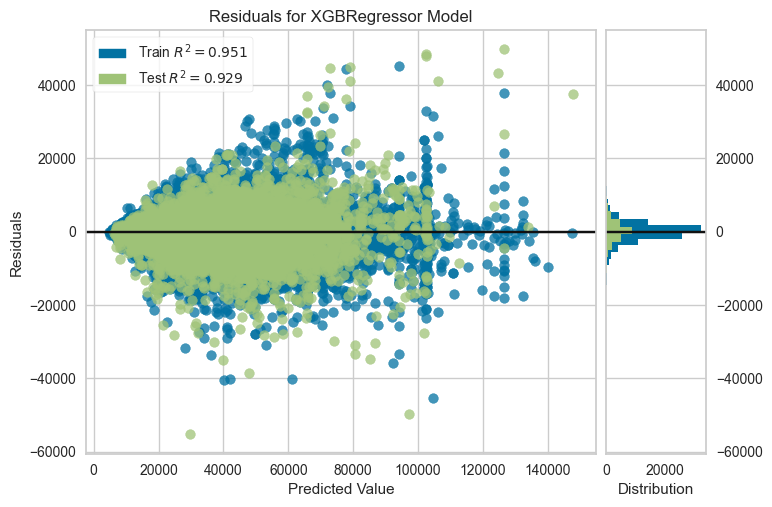

<Axes: title={'center': 'Residuals for XGBRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [176]:
visualizer = ResidualsPlot(xgb_model)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show() 

***

## <a class="my-anchor2" id="lightgbm"> LightGBM Regressor </a>

* [Home](#content)

In [170]:
from lightgbm import LGBMRegressor
import os
os.environ["JOBLIB_START_METHOD"] = "spawn"


lgbm = LGBMRegressor(force_row_wise=True) 

lgbm_model = lgbm.fit(X_train, y_train)

y_train_pred = lgbm_model.predict(X_train)
y_pred = lgbm_model.predict(X_test)


train_val(y_train, y_train_pred, y_test, y_pred, "lgbm_model")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 546
[LightGBM] [Info] Number of data points in the train set: 98130, number of used features: 77
[LightGBM] [Info] Start training from score 30496.006094


,lgbm_model_train,lgbm_model_test
R2,0.9215,0.9179
mae,2609.9578,2643.2755
mse,15161802.3134,15860336.5371
rmse,3893.8159,3982.5038


## <a class="my-anchor2" id="gridlin"> Grid Search for LightGBM Regressor </a>

* [Home](#content)

In [171]:
from sklearn.model_selection import RandomizedSearchCV
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
import numpy as np


param_grid = {
    'num_leaves': [31, 50, 100, 150],  
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'min_child_samples': [10, 20, 30, 50],
    'subsample': [0.5, 0.8, 1.0],
    'reg_alpha': [0, 0.1, 0.5, 1.0],
    'reg_lambda': [0, 0.1, 0.5, 1.0]
}

lgbm = LGBMRegressor(force_row_wise=True, random_state=101)

rs_model = RandomizedSearchCV(estimator=lgbm,
                              param_distributions=param_grid,
                              scoring='neg_mean_squared_error',
                              n_iter=30,  
                              cv=5,
                              n_jobs=1,
                              random_state=42)

# Modeli eğitelim
rs_model.fit(X_train, y_train)

# En iyi parametreleri yazdıralım
print("Best parameters found :", rs_model.best_params_)



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 78504, number of used features: 77
[LightGBM] [Info] Start training from score 30510.301373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

In [173]:
# with rscv best parameters
lgbm_rscv = LGBMRegressor(force_row_wise=True, subsample = 1.0, reg_lambda = 0.5, 
                     reg_alpha = 0.1, num_leaves = 100, min_child_samples = 10, 
                     max_depth = 9, learning_rate = 0.2) 

lgbm_rscv_model = lgbm_rscv.fit(X_train, y_train)

y_train_pred = lgbm_rscv_model.predict(X_train)
y_pred = lgbm_rscv_model.predict(X_test)


train_val(y_train, y_train_pred, y_test, y_pred, "lgbm_rscv_model")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 98130, number of used features: 78
[LightGBM] [Info] Start training from score 30496.006094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,lgbm_rscv_model_train,lgbm_rscv_model_test
R2,0.9387,0.9259
mae,2293.8042,2468.6986
mse,11840043.9040,14314784.3335
rmse,3440.9365,3783.4884


In [172]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'num_leaves': [50, 100],  
    'learning_rate': [0.05, 0.1],
    'max_depth': [5, 7],
    'min_child_samples': [20, 30],
    'subsample': [0.8, 1.0],
    'reg_alpha': [0, 0.1],
    'reg_lambda': [0, 0.1]
}


lgbm = LGBMRegressor(force_row_wise=True, random_state=101)

grid_model = GridSearchCV(estimator=lgbm,
                          param_grid=param_grid,
                          scoring='neg_mean_squared_error',
                          cv=5,
                          n_jobs=1)


grid_model.fit(X_train, y_train)

print("Best parameters found :", grid_model.best_params_)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 78504, number of used features: 77
[LightGBM] [Info] Start training from score 30510.301373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

In [174]:
# best Parameter von gridsearchCV

lgbm_gr = LGBMRegressor(subsample = 0.8, reg_lambda = 0, 
                     reg_alpha = 0.1, num_leaves = 100,
                      min_child_samples = 20, max_depth = 7,
                      learning_rate=0.1, force_row_wise=True) 

lgbm_gr_model = lgbm_gr.fit(X_train, y_train)

y_train_pred = lgbm_gr_model.predict(X_train)
y_pred = lgbm_gr_model.predict(X_test)

train_val(y_train, y_train_pred, y_test, y_pred, "lgbm_gr_model")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 546
[LightGBM] [Info] Number of data points in the train set: 98130, number of used features: 77
[LightGBM] [Info] Start training from score 30496.006094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

,lgbm_gr_model_train,lgbm_gr_model_test
R2,0.9252,0.9187
mae,2543.6987,2620.4987
mse,14451018.1573,15689294.6499
rmse,3801.4495,3960.9714


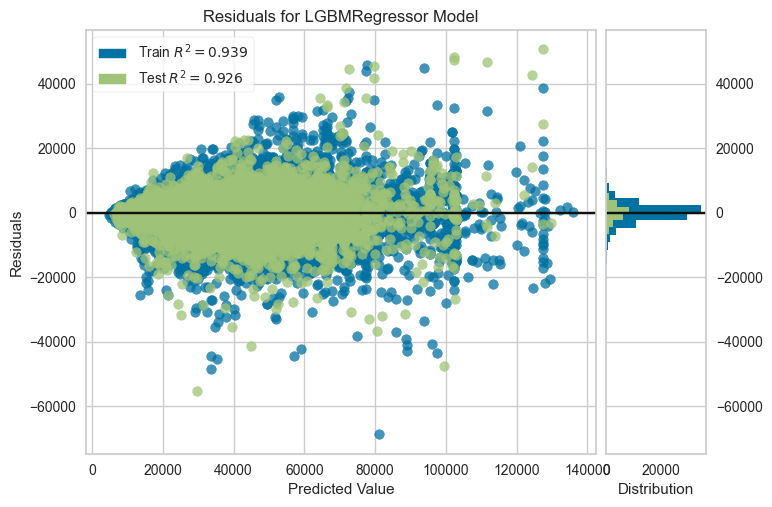

<Axes: title={'center': 'Residuals for LGBMRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [175]:
from yellowbrick.regressor import ResidualsPlot
# visual with best score
# Instantiate the linear model and visualizer

visualizer = ResidualsPlot(lgbm_rscv_model)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show() 

[LightGBM] [Info] Total Bins 556
[LightGBM] [Info] Number of data points in the train set: 98130, number of used features: 80
[LightGBM] [Info] Start training from score 30496.006094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


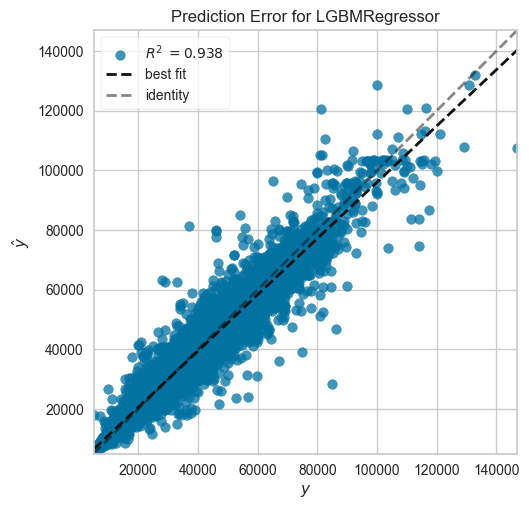

In [63]:
from yellowbrick.regressor import PredictionError

# Instantiate the linear model and visualizer
lgbm = LGBMRegressor(subsample = 1.0, reg_lambda = 0.5, 
                     reg_alpha = 0.1, num_leaves = 100,
                      min_child_samples = 10, max_depth = 9,
                      learning_rate=0.2, force_row_wise=True) 

lgbm_model = lgbm.fit(X_train, y_train)

visualizer = PredictionError(lgbm_model)

visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

## <a class="my-anchor2" id="feaimp"> Feature Importance in LightGBM Regressor </a>

* [Home](#content)

In [57]:
import lightgbm as lgb
import pandas as pd
from sklearn.model_selection import train_test_split

lgbm = LGBMRegressor(subsample = 1.0, reg_lambda = 0.5, 
                     reg_alpha = 0.1, num_leaves = 100,
                      min_child_samples = 10, max_depth = 9,
                      learning_rate=0.2, force_row_wise=True) 

lgbm_model = lgbm.fit(X_train, y_train)


imp_feats = pd.DataFrame(index=X.columns, data=lgbm_model.feature_importances_, columns=['lgbm_Importance'])
lgbm_imp_feats = imp_feats.sort_values('lgbm_Importance', ascending=False)

# Display the feature importances
print(lgbm_imp_feats)


[LightGBM] [Info] Total Bins 556
[LightGBM] [Info] Number of data points in the train set: 98130, number of used features: 80
[LightGBM] [Info] Start training from score 30496.006094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
                       lgbm_Importance
km                                2704
kw                                1594
reg_year                          1143
reg_month                          951
fuel                               449
...                                ...
Model_ecosport                       8
Model_crossland_x                    8
Model_adam                           6
Model_a_180                          5
gearbox_Halbautomatik                0

[80 rows x 1 columns]


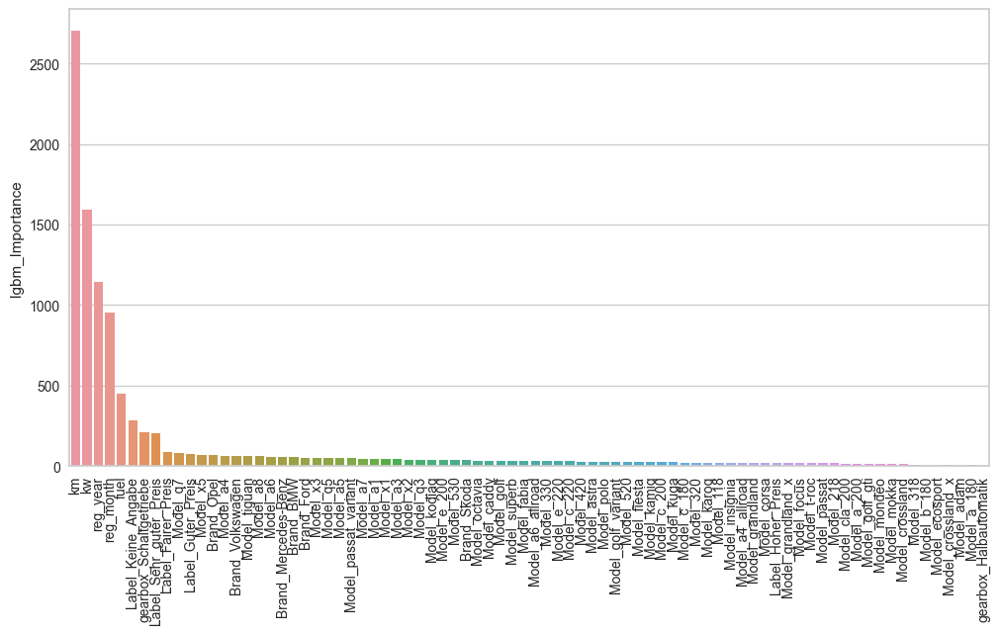

In [58]:
plt.figure(figsize=(12,6))
sns.barplot(data=lgbm_imp_feats, x=lgbm_imp_feats.index, y='lgbm_Importance')

plt.xticks(rotation=90);

***
***

## <a class="my-anchor2" id="auswertung"> Auswertung </a>

* [Home](#content)

<style>
table {
  border-collapse: collapse;
}

th, td {
  border: 1px solid black;
  padding: 8px;
  text-align: center;
}

th {
  background-color: green;
}

.r2_highlight {
  color: red;
}
</style>
<table>
  <tr>
    <th>Metric</th>
    <th>Score</th>
  </tr>
  <tr>
    <td>linear_model_train</td>
    <td>0.8274</td>
  </tr>
  <tr>
    <td>linear_model_test</td>
    <td>0.8275</td>
  </tr>
  <tr>
    <td>Ridge_train</td>
    <td>0.8282</td>
  </tr>
  <tr>
    <td>Ridge_test</td>
    <td>0.8243</td>
  </tr>
  <tr>
    <td>Lasso_train</td>
    <td>0.8271</td>
  </tr>
  <tr>
    <td>Lasso_test</td>
    <td>0.8287</td>
  </tr>
  <tr>
    <td>ElasticNet_train</td>
    <td>0.8268</td>
  </tr>
  <tr>
    <td>ElasticNet_test</td>
    <td>0.8299</td>
  </tr>
  <tr>
    <td>elastic_GRmodel_train</td>
    <td>0.8268</td>
  </tr>
  <tr>
    <td>elasticGR_model_test</td>
    <td>0.8263</td>
  </tr>
  <tr>
    <td class="r2_highlight">Rf Model_train</td>
    <td class="r2_highlight">0.9776</td>
  </tr>
  <tr>
    <td class="r2_highlight">Rf Model_test</td>
    <td class="r2_highlight">0.9269</td>
  </tr>
  <tr>
    <td class="r2_highlight">Rf GR_Model_train</td>
    <td class="r2_highlight">0.9592</td>
  </tr>
  <tr>
    <td class="r2_highlight">Rf GR_Model_test</td>
    <td class="r2_highlight">0.9250</td>
  </tr>
  <tr>
    <td>ada_model_train</td>
    <td>0.2224</td>
  </tr>
  <tr>
    <td>ada_model_test</td>
    <td>0.2211</td>
  </tr>
  <tr>
    <td>grad_model_train</td>
    <td>0.8812</td>
  </tr>
  <tr>
    <td>grad_model_test</td>
    <td>0.8783</td>
  </tr>
  <tr>
    <td class="r2_highlight">xgb_GRmodel_train</td>
    <td class="r2_highlight">0.9349</td>
  </tr>
  <tr>
    <td class="r2_highlight">xgb_GRmodel_test</td>
    <td class="r2_highlight">0.9229</td>
  </tr>
  <tr>
    <td class="r2_highlight">xgb_model_train</td>
    <td class="r2_highlight">0.9505</td>
  </tr>
  <tr>
    <td class="r2_highlight">xgb_model_test</td>
    <td class="r2_highlight">0.9288</td>
  </tr>
  <tr>
    <td class="r2_highlight">lgbm_model_train</td>
    <td class="r2_highlight">0.9215</td>
  </tr>
  <tr>
    <td class="r2_highlight">lgbm_model_test</td>
    <td class="r2_highlight">0.9179</td>
  </tr>
  <tr>
    <td class="r2_highlight">lgbm_rscv_model_train</td>
    <td class="r2_highlight">0.9387</td>
  </tr>
  <tr>
    <td class="r2_highlight">lgbm_rscv_model_test</td>
    <td class="r2_highlight">0.9259</td>
  </tr>
  <tr>
    <td class="r2_highlight">lgbm_gr_model_train</td>
    <td class="r2_highlight">0.9252</td>
  </tr>
  <tr>
    <td class="r2_highlight">lgbm_gr_model_test</td>
    <td class="r2_highlight">0.9187</td>
  </tr>
</table>


<font color="lightgreen" size="6"> Generell zu bewerten:</font><br>
<font color="lightblue" size="4">1. können wir sagen, dass Random Forest und Boosting-Modelle erfolgreicher sind als lineare Modelle.<br>
2. Das RF-Modell hat die höchste Train-Punktzahl, aber es konnte nicht den gleichen Erfolg in der Testmenge zeigen.<br>
3. der zweithöchste Wert in Train score wird im XGB-Modell gesehen. Die Reflexion dieser Situation im Test ist mit 0,93 besser als bei den RF-Modellen.<br>
4. An dieser Stelle ist der Erfolg des LightGBM-Modells zu erwähnen, das die höchste Punktzahl mit einer viel schnelleren Leistung als die anderen Modelle in Bezug auf die Laufzeit erreicht hat.</font>

***
***